Code for importing the Geo-Location Data set and performing few EDA on it

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from ipywidgets import widgets, interactive
import plotly.express as px
import plotly.io as pio
pio.renderers.default = 'notebook_connected'

#Taking the geoLocation path of all the locations of AirBnB
geoLocationPath = 'M:\Studies\Sem 2\Data Visualisation\Assignemnt\Airbnb\geolocation.csv'
geoLocationData = pd.read_csv(geoLocationPath, delimiter=';', decimal=',')

geoLocationData.info()
geoLocationData.head()

#Now handling the missing values in the data set

na_Values = geoLocationData.isna()
na_Values

#For handling the missing values in street Name

na_StreetName = geoLocationData[geoLocationData['street_name'].isna()]
na_Total = geoLocationData['street_name'].isna().sum()
na_Total

#Replacing NA values by values based on longitutde and latitude values available in data set
coord_to_street_map = geoLocationData.dropna(subset=['street_name']).set_index(['latitude', 'longitude'])['street_name'].to_dict()

geoLocationData.loc[geoLocationData['street_name'].isna(), 'street_name'] = geoLocationData[geoLocationData['street_name'].isna()].apply(
    lambda row: coord_to_street_map.get((row['latitude'], row['longitude'])), axis=1)

# Check if there are still NaN values in street_name
remaining_nan = geoLocationData['street_name'].isna().sum()
na_Total,remaining_nan

#For the remaining missing values , replacing them by 'Street Name Unknown'
geoLocationData['street_name'].fillna('Street Name Unknown', inplace=True)

# Verify if there are still NaN values in street_name
remaining_nan_after_fill = geoLocationData['street_name'].isna().sum()

remaining_nan_after_fill



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49311 entries, 0 to 49310
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   unified_id   49311 non-null  object 
 1   month        49311 non-null  object 
 2   street_name  11589 non-null  object 
 3   latitude     49311 non-null  float64
 4   longitude    49311 non-null  float64
dtypes: float64(2), object(3)
memory usage: 1.9+ MB


0

Code for the data visualisation of street with the highest number of AirBnB

In [2]:
import plotly.express as px
top_streets = geoLocationData[geoLocationData['street_name'] != 'Street Name Unknown']['street_name'].value_counts().head(10)

# Converting the Series to DataFrame for Plotly
top_streets_df = top_streets.reset_index()
top_streets_df.columns = ['Street Name', 'Number of Records']

top_streets_df_sorted = top_streets_df.sort_values(by='Number of Records', ascending=True)

# To create interactive hover on bar plot using plotly
fig = px.bar(top_streets_df_sorted, y='Street Name', x='Number of Records', 
             orientation='h',  
             color='Number of Records',  
             color_continuous_scale=px.colors.sequential.Viridis, 
             title='Top 10 Street Names by Number of AirBnB')


fig.update_layout(xaxis_title='Number of Records',
                  yaxis_title='Street Name',
                  coloraxis_colorbar=dict(title="Records"))

fig.show()

Scatter Plot - Data visualisation for presence of different AirBnB based on latitude and longitutde bins

In [3]:
# Geographic Distribution of Records and dividing them to different bins for better clarity
geoLocationData['latitude_bin'] = pd.cut(geoLocationData['latitude'], bins=4, labels=['Low', 'Medium-Low', 'Medium-High', 'High'])
geoLocationData['longitude_bin'] = pd.cut(geoLocationData['longitude'], bins=4, labels=['West', 'Central-West', 'Central-East', 'East'])

def update_plot(latitude_bin, longitude_bin):
    if latitude_bin == "All" and longitude_bin == "All":
        filtered_data = geoLocationData.copy()
        filtered_data['color'] = pd.Categorical(filtered_data['latitude_bin']).codes 
    elif latitude_bin == "All":
        filtered_data = geoLocationData[geoLocationData['longitude_bin'] == longitude_bin].copy()
        filtered_data['color'] = pd.Categorical(filtered_data['latitude_bin']).codes 
    elif longitude_bin == "All":
        filtered_data = geoLocationData[geoLocationData['latitude_bin'] == latitude_bin].copy()
        filtered_data['color'] = pd.Categorical(filtered_data['longitude_bin']).codes 
    else:
        filtered_data = geoLocationData[(geoLocationData['latitude_bin'] == latitude_bin) & (geoLocationData['longitude_bin'] == longitude_bin)].copy()
        filtered_data['color'] = 'blue'  
    
    # Create and display the plot (the scatter plot)
    fig = go.Figure(data=go.Scatter(x=filtered_data['longitude'], 
                                    y=filtered_data['latitude'], 
                                    mode='markers',
                                    marker=dict(color=filtered_data['color'], colorscale='Viridis', showscale=True)))
    
    fig.update_layout(title='Interactive Geographic Distribution by Selected Bins',
                      xaxis_title='Longitude',
                      yaxis_title='Latitude',
                      xaxis=dict(showgrid=True),
                      yaxis=dict(showgrid=True))
    fig.show()


latitude_options = ['All'] + geoLocationData['latitude_bin'].unique().categories.tolist()
longitude_options = ['All'] + geoLocationData['longitude_bin'].unique().categories.tolist()

latitude_bin_dropdown = widgets.Dropdown(options=latitude_options, description='Latitude Bin:', value='All')
longitude_bin_dropdown = widgets.Dropdown(options=longitude_options, description='Longitude Bin:', value='All')

# Display of the interactive widget
interactive_plot = interactive(update_plot, latitude_bin=latitude_bin_dropdown, longitude_bin=longitude_bin_dropdown)
display(interactive_plot)


interactive(children=(Dropdown(description='Latitude Bin:', options=('All', 'Low', 'Medium-Low', 'Medium-High'…

Geo Plot using "Open Street Map" by filtering only the California region ( For Aibrnb availbility based on the area)

In [4]:
min_lat, max_lat = 32.5, 42.0  # Latitude bounds for California Region
min_lon, max_lon = -124.5, -114.1  # Longitude bounds for California Region
california_df = geoLocationData[(geoLocationData['latitude'] >= min_lat) & (geoLocationData['latitude'] <= max_lat) &
                               (geoLocationData['longitude'] >= min_lon) & (geoLocationData['longitude'] <= max_lon)]

# Taking the subsetof data , as the application wasn't able to handle complete data
california_df_subset = california_df.head(40000)
california_df_subset.head()

# Using the more filtered data by removing any missing values
cleaned_california_df_subset = california_df_subset.dropna(subset=['latitude', 'longitude'])
cleaned_california_df_subset.head()

fig = px.scatter_mapbox(cleaned_california_df_subset,
                        lat="latitude",
                        lon="longitude",
                        zoom=5,  
                        center={"lat": 35.7783, "lon": -118.4179}, 
                        height=600,
                        width=800,
                        title="Geolocation Points of AirBnB in California")

fig.update_layout(mapbox_style="open-street-map")  #Here we deaclare the map style used 
fig.show()


Importing the Amenities Data set

In [5]:
amenitiesPath = r'M:\Studies\Sem 2\Data Visualisation\Assignemnt\Airbnb\amenities.csv'
amenities_data = pd.read_csv(amenitiesPath)
amenities_data.info()
amenities_data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49311 entries, 0 to 49310
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   unified_id  49311 non-null  object
 1   month       49311 non-null  object
 2   hot tub     49311 non-null  int64 
 3   pool        49311 non-null  int64 
dtypes: int64(2), object(2)
memory usage: 1.5+ MB


,unified_id,month,hot tub,pool
0,AIR10052559,2022-12,1,0
1,AIR10178668,2022-12,0,0
2,AIR10211700,2022-12,0,0
3,AIR10344705,2022-12,0,0
4,AIR10424683,2022-12,0,1


Data Visualisation - Pie Chart for the representation of split of hot tub and pool 

In [6]:
both_amenities = (amenities_data['hot tub'] & amenities_data['pool']).sum()
neither_amenity = ((amenities_data['hot tub'] == 0) & (amenities_data['pool'] == 0)).sum()
atleast_one = len(amenities_data) - (both_amenities + neither_amenity)

labels = ['Both Hot Tub and Pool', 'Neither Hot Tub Nor Pool', 'At least Hot Tub or Pool']
sizes = [both_amenities, neither_amenity, atleast_one]
colors = ['#ff9999', '#66b3ff', '#D3D3D3']  

# Pie chart for showing the split of amenties
fig = go.Figure(data=[go.Pie(labels=labels, values=sizes, marker_colors=colors, pull=[0.1, 0, 0])])

fig.update_layout(title_text='Distribution of Listings with Hot Tub and Pool Amenities', 
                  title_x=0.5)

# Hover details to be displayed
fig.update_traces(textinfo='percent+label', hoverinfo='label+percent', 
                  marker=dict(line=dict(color='#000000', width=2))) 

fig.show()

Data Visualisation : Time Series line graph showing the number of hot tub and pool over the months

In [7]:
amenities_data['month'] = pd.to_datetime(amenities_data['month'], format='%Y-%m')

# Group by month and calculate the sum of each amenity
monthly_amenities = amenities_data.groupby(amenities_data['month'].dt.to_period('M')).agg({'hot tub': 'sum', 'pool': 'sum'})

# Reset index to convert PeriodIndex to DateTimeIndex
monthly_amenities = monthly_amenities.reset_index()
monthly_amenities['month'] = monthly_amenities['month'].dt.strftime('%Y-%m')

fig = go.Figure()

# Ta add traces for 'Hot Tub' and 'Pool'
fig.add_trace(go.Scatter(x=monthly_amenities['month'], y=monthly_amenities['hot tub'],
                         mode='lines+markers', name='Hot Tub',
                         line=dict(color='royalblue'), marker=dict(symbol='circle')))
fig.add_trace(go.Scatter(x=monthly_amenities['month'], y=monthly_amenities['pool'],
                         mode='lines+markers', name='Pool',
                         line=dict(color='firebrick'), marker=dict(symbol='circle')))

# For  readability and interactivity when we go over the points
fig.update_layout(title='Monthly Availability of Amenities',
                  xaxis_title='Month',
                  yaxis_title='Number of Amenities Available',
                  legend_title='Amenities',
                  xaxis=dict(tickangle=-45),
                  hovermode='x unified')  # Unified hover label for better comparison

fig.show()

Importing the Market data over the years and performing few data cleaning steps here

In [8]:
#For getting the market data of the airbnb
marketPath = 'M:\Studies\Sem 2\Data Visualisation\Assignemnt\Airbnb\market.csv'
market_data = pd.read_csv(marketPath, delimiter=';')
market_data.info()
market_data.head()

#Performing EDA to convert the data types of numeric from object
for col in ['revenue', 'occupancy', 'nightly rate']:
    market_data[col] = market_data[col].str.replace(',', '.').astype(float)

market_data['lead time'] = pd.to_numeric(market_data['lead time'], errors='coerce')
market_data['length stay'] = pd.to_numeric(market_data['length stay'], errors='coerce')


#For finding out the missing values
missing_data = market_data.isnull().sum()
#Removing the rows with missing value of revenue as it as only 6 missing values
market_dataFinal = market_data.dropna(subset=['revenue'])
missing_data_after_removal = market_dataFinal.isnull().sum()

#Imputing the missing values of nightly rate, lead time and length of stay by median values
for col in ['nightly rate', 'lead time', 'length stay']:
    if market_dataFinal[col].dtype in ['float64', 'int64']:
        market_dataFinal[col].fillna(market_dataFinal[col].median(), inplace=True)
# Now, apply median imputation to fill missing values in 'lead time' and 'length stay'
# Impute missing values for 'lead time'
market_dataFinal['lead time'].fillna(market_dataFinal['lead time'].median(), inplace=True)

# Impute missing values for 'length stay'
market_dataFinal['length stay'].fillna(market_dataFinal['length stay'].median(), inplace=True)
# Re-check the number of missing values after applying median imputation
missing_data_afterIputation = market_dataFinal.isnull().sum()

missing_data_afterIputation



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 116619 entries, 0 to 116618
Data columns (total 14 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   unified_id    116619 non-null  int64  
 1   month         116619 non-null  object 
 2   zipcode       116619 non-null  int64  
 3   city          116619 non-null  object 
 4   host_type     116619 non-null  object 
 5   bedrooms      116619 non-null  int64  
 6   bathrooms     116619 non-null  float64
 7   guests        116619 non-null  object 
 8   revenue       116613 non-null  object 
 9   openness      116619 non-null  int64  
 10  occupancy     116619 non-null  object 
 11  nightly rate  93146 non-null   object 
 12  lead time     86025 non-null   object 
 13  length stay   86025 non-null   object 
dtypes: float64(1), int64(4), object(9)
memory usage: 12.5+ MB


C:\Users\Admin\AppData\Local\Temp\ipykernel_16364\3932381811.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Admin\AppData\Local\Temp\ipykernel_16364\3932381811.py:27: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Admin\AppData\Local\Temp\ipykernel_16364\3932381811.py:30: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



unified_id      0
month           0
zipcode         0
city            0
host_type       0
bedrooms        0
bathrooms       0
guests          0
revenue         0
openness        0
occupancy       0
nightly rate    0
lead time       0
length stay     0
dtype: int64

Data Visualisation : Time series represenatation of revenue and occupancy over the years

In [9]:

# Ensure the 'month' column is in datetime format
market_dataFinal['month'] = pd.to_datetime(market_dataFinal['month'], format='%Y-%m')

# Extracting the year and month number for grouping for the drop down and the plot
market_dataFinal['year'] = market_dataFinal['month'].dt.year
market_dataFinal['month_num'] = market_dataFinal['month'].dt.month  # Ensure this line is executed

def plot_data(selected_year):
    # getting the data from the data frame for the selected year
    df_filtered = market_dataFinal[market_dataFinal['year'] == selected_year]
    
    # Group by month to calculate the sum of revenue and mean occupancy
    monthly_metrics = df_filtered.groupby('month_num').agg({'revenue': 'sum', 'occupancy': 'mean'}).reset_index()
    
    fig = go.Figure()

    # TO track the revenue over the plot
    fig.add_trace(go.Scatter(x=monthly_metrics['month_num'], y=monthly_metrics['revenue'],
                             mode='lines+markers', name='Revenue',
                             line=dict(color='firebrick'), marker=dict(symbol='circle')))
    
    # Adding the occupancy tracking also here
    fig.add_trace(go.Scatter(x=monthly_metrics['month_num'], y=monthly_metrics['occupancy'],
                             mode='lines+markers', name='Occupancy',
                             line=dict(color='royalblue'), marker=dict(symbol='circle'),
                             yaxis='y2')) 
    
    # Update the layout to configure the secondary y-axis for Occupancy
    fig.update_layout(
        title=f'Revenue and Occupancy by Month for {selected_year}',
        xaxis_title='Month',
        yaxis_title='Revenue in dollars',
        yaxis=dict(title='Revenue in dollars'),
        yaxis2=dict(title='Average Occupancy', overlaying='y', side='right', showgrid=False),  # Secondary y-axis for Occupancy
        xaxis=dict(tickmode='array', tickvals=list(range(1, 13)), ticktext=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']),
        legend=dict(x=0.01, y=0.99, bordercolor='Black', borderwidth=1)
    )
    
    fig.show()

# Create a dropdown for selecting the year, with the options sorted and allowing dynamic update based on selection
year_dropdown = widgets.Dropdown(options=sorted(market_dataFinal['year'].unique()), description='Year:')

# Display the interactive plot
interactive_plot = interactive(plot_data, selected_year=year_dropdown)
display(interactive_plot)


C:\Users\Admin\AppData\Local\Temp\ipykernel_16364\3144276694.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Admin\AppData\Local\Temp\ipykernel_16364\3144276694.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Admin\AppData\Local\Temp\ipykernel_16364\3144276694.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/panda

interactive(children=(Dropdown(description='Year:', options=(2020, 2021, 2022), value=2020), Output()), _dom_c…

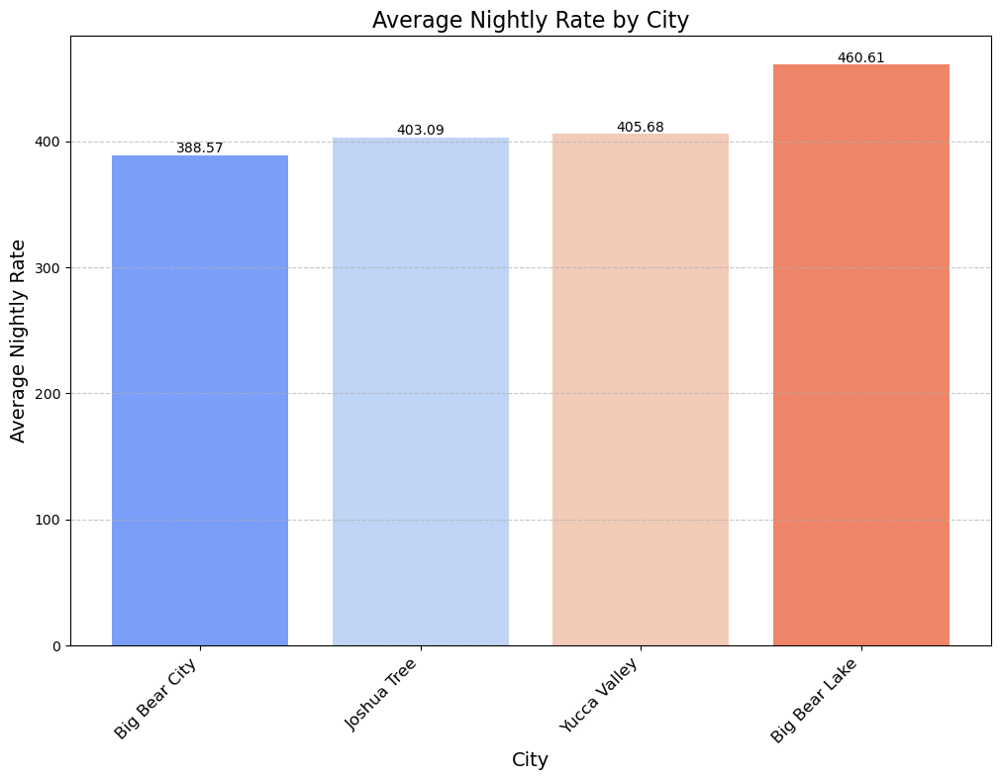

In [10]:
#To get the mean or average nightly rate for each city
average_nightly_rate_by_city = market_dataFinal.groupby('city')['nightly rate'].mean().sort_values()

colors = sns.color_palette('coolwarm', len(average_nightly_rate_by_city))

plt.figure(figsize=(12, 8))
bars = plt.bar(average_nightly_rate_by_city.index, average_nightly_rate_by_city.values, color=colors)

plt.title('Average Nightly Rate by City', fontsize=16)
plt.xlabel('City', fontsize=14)
plt.ylabel('Average Nightly Rate', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)  

plt.grid(axis='y', linestyle='--', alpha=0.7)

# Annotating bars with the average nightly rate value
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom', fontsize=10)

plt.show()

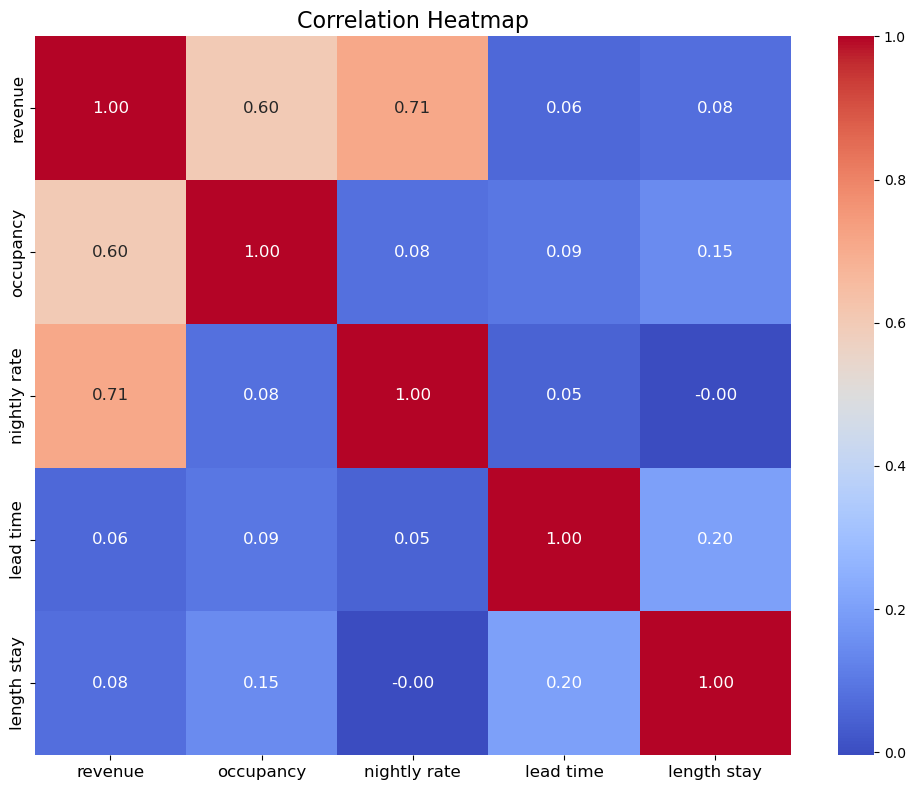

In [11]:
# Selecting numerical columns for correlation analysis
numerical_cols = ['revenue', 'occupancy', 'nightly rate', 'lead time', 'length stay']
corr_matrix = market_dataFinal[numerical_cols].corr()

# corr_matrix from your code
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={'size': 12})
plt.title('Correlation Heatmap', fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


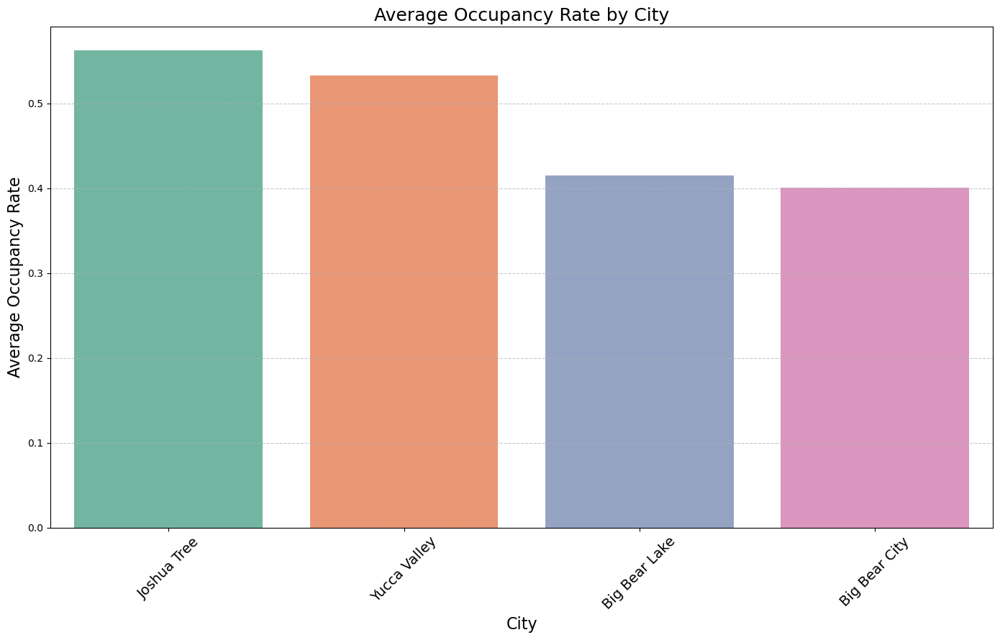

In [12]:
average_occupancy_by_city = market_dataFinal.groupby('city')['occupancy'].mean().reset_index()

# Here we sort the city based on the highest number of occupancy
average_occupancy_by_city = average_occupancy_by_city.sort_values(by='occupancy', ascending=False)

plt.figure(figsize=(14, 9))
barplot = sns.barplot(data=average_occupancy_by_city, x='city', y='occupancy', palette='Set2')

plt.title('Average Occupancy Rate by City', fontsize=18)
plt.xlabel('City', fontsize=16)
plt.ylabel('Average Occupancy Rate', fontsize=16)
plt.xticks(rotation=45, fontsize=14)  

plt.grid(True, axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()  
plt.show()

In [13]:
market_dataFinal['year'] = market_dataFinal['month'].dt.year
market_dataFinal['month_num'] = market_dataFinal['month'].dt.month

#To calculate the avergae revenue based on all three attribute
revenue_growth = market_dataFinal.groupby(['city', 'year', 'month_num'])['revenue'].sum().reset_index()


revenue_growth['period'] = revenue_growth['year'].astype(str) + '-' + revenue_growth['month_num'].astype(str).str.zfill(2)
revenue_growth['period'] = pd.to_datetime(revenue_growth['period'], format='%Y-%m')

# Creating Pivot for the graph purpose
revenue_growth_pivot = revenue_growth.pivot("period", "city", "revenue")


#TO get the unique name of the city and then plot based on the above requirement
data = []
for city in revenue_growth['city'].unique():
    city_data = revenue_growth[revenue_growth['city'] == city]
    trace = go.Scatter(
        x=city_data['period'],
        y=city_data['revenue'],
        mode='lines+markers',
        name=city,
        hoverinfo='x+y+name',
        line_shape='linear'
    )
    data.append(trace)


fig = go.Figure(data=data)

fig.update_layout(
    title='Growth in Revenue by City Over Months',
    xaxis_title='Month',
    yaxis_title='Revenue',
    legend_title='City',
    hovermode='closest'
)


fig.update_xaxes(tickangle=-45, tickmode='auto', nticks=20, tickformat='%Y-%m')


fig.show()



C:\Users\Admin\AppData\Local\Temp\ipykernel_16364\2487322724.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Admin\AppData\Local\Temp\ipykernel_16364\2487322724.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Admin\AppData\Local\Temp\ipykernel_16364\2487322724.py:12: FutureWarning:

In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.



In [14]:
#Making sure of data type of unified_id before merging the dataset

market_dataFinal['unified_id']=market_dataFinal['unified_id'].astype('str')
geoLocationData['unified_id']=geoLocationData['unified_id'].astype('str')

#As the AIR was missing in the market data, adding it before merger
market_dataFinal['unified_id'] = 'AIR' + market_dataFinal['unified_id']
print(geoLocationData['unified_id'].unique()[:5])
print(market_dataFinal['unified_id'].unique()[:5])
print(geoLocationData['unified_id'].dtype)
print(market_dataFinal['unified_id'].dtype)

['AIR10052559' 'AIR10178668' 'AIR10211700' 'AIR10344705' 'AIR10424683']
['AIR10000347' 'AIR10052559' 'AIR10178668' 'AIR10204420' 'AIR10211502']
object
object


C:\Users\Admin\AppData\Local\Temp\ipykernel_16364\451093864.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Admin\AppData\Local\Temp\ipykernel_16364\451093864.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [15]:
combined_finalData = pd.merge(geoLocationData, market_dataFinal, on='unified_id', how='inner')
combined_finalData.info()
combined_finalData.head()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 1548860 entries, 0 to 1548859
Data columns (total 22 columns):
 #   Column         Non-Null Count    Dtype         
---  ------         --------------    -----         
 0   unified_id     1548860 non-null  object        
 1   month_x        1548860 non-null  object        
 2   street_name    1548860 non-null  object        
 3   latitude       1548860 non-null  float64       
 4   longitude      1548860 non-null  float64       
 5   latitude_bin   1548860 non-null  category      
 6   longitude_bin  1548860 non-null  category      
 7   month_y        1548860 non-null  datetime64[ns]
 8   zipcode        1548860 non-null  int64         
 9   city           1548860 non-null  object        
 10  host_type      1548860 non-null  object        
 11  bedrooms       1548860 non-null  int64         
 12  bathrooms      1548860 non-null  float64       
 13  guests         1548860 non-null  object        
 14  revenue        1548860 non-null  f

,unified_id,month_x,street_name,latitude,longitude,latitude_bin,longitude_bin,month_y,zipcode,city,...,bathrooms,guests,revenue,openness,occupancy,nightly rate,lead time,length stay,year,month_num
0,AIR10052559,2022-12,Heavenly Valley Road,34.23948,-116.87991,Medium-High,West,2020-01-01,92315,Big Bear Lake,...,2.5,8,10055.0,31,0.516129,628.437500,19.0,3.0,2020,1
1,AIR10052559,2022-12,Heavenly Valley Road,34.23948,-116.87991,Medium-High,West,2020-10-01,92315,Big Bear Lake,...,2.5,8,20959.0,31,1.000000,676.096774,18.0,9.0,2020,10
2,AIR10052559,2022-12,Heavenly Valley Road,34.23948,-116.87991,Medium-High,West,2020-11-01,92315,Big Bear Lake,...,2.5,8,13622.0,30,0.733333,619.181818,19.0,3.0,2020,11
3,AIR10052559,2022-12,Heavenly Valley Road,34.23948,-116.87991,Medium-High,West,2020-12-01,92315,Big Bear Lake,...,2.5,8,16185.0,31,0.612903,851.842105,19.0,3.0,2020,12
4,AIR10052559,2022-12,Heavenly Valley Road,34.23948,-116.87991,Medium-High,West,2020-02-01,92315,Big Bear Lake,...,2.5,8,6000.0,29,0.344828,600.000000,19.0,3.0,2020,2


In [18]:
#Using the unique 'unified_id value because of preswence of duplicate values'
#Again using the california longitude and latitude region for the map style
unique_combined_finalData = combined_finalData.drop_duplicates(subset=['unified_id'])
filtered_data = unique_combined_finalData[
    (unique_combined_finalData['latitude'] >= min_lat) & (unique_combined_finalData['latitude'] <= max_lat) &
    (unique_combined_finalData['longitude'] >= min_lon) & (unique_combined_finalData['longitude'] <= max_lon)
]

filtered_data['hover_text'] = 'ID: ' + filtered_data['unified_id'].astype(str) + \
                              '<br>Revenue: $' + filtered_data['revenue'].round().astype(str) + \
                              '<br>Occupancy Rate: ' + (filtered_data['occupancy'] * 100).round().astype(str) + '%'

fig = px.scatter_mapbox(filtered_data,
                        lat="latitude",
                        lon="longitude",
                        color="revenue",  
                        size="revenue",  
                        hover_name="unified_id",  
                        hover_data={"revenue": True,  
                                    "occupancy": ":.2f",  
                                    "latitude": False,  
                                    "longitude": False}, 
                        zoom=5,  
                        center={"lat": 36.7783, "lon": -119.4179},  # Centering on California region
                        height=600,
                        width=800,
                        title="Revenue and Occupancy by Geographic Location within California",
                        color_continuous_scale=px.colors.sequential.Plasma)  

# The map style to 'open-street-map'
fig.update_layout(mapbox_style="open-street-map")

fig.show()

In [19]:
# Aggregate data to get average revenue by city and month
heatmap_data = market_dataFinal.groupby(['city', 'month'])['revenue'].mean().reset_index()

heatmap_data_pivoted = heatmap_data.pivot("city", "month", "revenue")

# Create heatmap for finding the correlation
fig = px.imshow(heatmap_data_pivoted, labels=dict(x="Month", y="City", color="Average Revenue"),
                x=heatmap_data_pivoted.columns, y=heatmap_data_pivoted.index,
                color_continuous_scale=px.colors.sequential.Viridis)
fig.update_layout(title="Average Monthly Revenue by City")
fig.show()

C:\Users\Admin\AppData\Local\Temp\ipykernel_11384\4094781088.py:4: FutureWarning:

In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.



In [16]:
fig = px.scatter_3d(market_dataFinal, x='nightly rate', y='occupancy', z='revenue',
                    color='occupancy',  
                    color_continuous_scale=px.colors.sequential.Viridis, 
                    title='Occupancy Rate and Nightly Rate vs Revenue',
                    labels={'nightly rate': 'Nightly Rate ($)',
                            'occupancy': 'Occupancy Rate (%)',
                            'revenue': 'Revenue ($)'})

#For the layout fitting
fig.update_layout(margin=dict(l=0, r=0, b=0, t=30))  

fig.show()

In [21]:
#Trying differnt oapproch for getting the visualisation on revenue, occupancy, nightly rate and length of stay using parallel coordinates

fig = px.parallel_coordinates(market_dataFinal, dimensions=['revenue', 'occupancy', 'nightly rate', 'length stay'],
                              color_continuous_scale=px.colors.diverging.Tealrose, title="Airbnb Listings Features")
fig.show()

C:\Users\Admin\anaconda3\Lib\site-packages\plotly\express\_core.py:279: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



In [17]:
filtered_data = unique_combined_finalData[(unique_combined_finalData['nightly rate'] <= 3000) & (unique_combined_finalData['revenue'] <= 100000)]

filtered_data['occupancy'] = pd.to_numeric(filtered_data['occupancy'], errors='coerce')

fig = px.scatter(filtered_data, x='nightly rate', y='revenue',
                 size='occupancy', # the size of each bubble
                 color='host_type',
                 title='Revenue vs. Nightly Rate by Host Type (Filtered)',
                 labels={'nightly rate': 'Nightly Rate', 'revenue': 'Revenue'},
                 hover_data=['host_type'])

fig.update_layout(legend_title_text='Host Type')
fig.show()

NameError: name 'unique_combined_finalData' is not defined

In [18]:
amenities_data['unified_id'] = amenities_data['unified_id'].astype(str)
market_dataFinal['unified_id'] = market_dataFinal['unified_id'].astype(str)

# Merge the two dataframes on 'unified_id'
market_amenitiesData = pd.merge(amenities_data, market_dataFinal, on='unified_id', how='outer')

market_amenitiesData.head()

C:\Users\Admin\AppData\Local\Temp\ipykernel_16364\2678633272.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,unified_id,month_x,hot tub,pool,month_y,zipcode,city,host_type,bedrooms,bathrooms,guests,revenue,openness,occupancy,nightly rate,lead time,length stay,year,month_num
0,AIR10052559,2022-12-01,1.0,0.0,2020-01-01,92315.0,Big Bear Lake,Professionals,3.0,2.5,8,10055.0,31.0,0.516129,628.437500,19.0,3.0,2020.0,1.0
1,AIR10052559,2022-12-01,1.0,0.0,2020-10-01,92315.0,Big Bear Lake,Professionals,3.0,2.5,8,20959.0,31.0,1.000000,676.096774,18.0,9.0,2020.0,10.0
2,AIR10052559,2022-12-01,1.0,0.0,2020-11-01,92315.0,Big Bear Lake,Professionals,3.0,2.5,8,13622.0,30.0,0.733333,619.181818,19.0,3.0,2020.0,11.0
3,AIR10052559,2022-12-01,1.0,0.0,2020-12-01,92315.0,Big Bear Lake,Professionals,3.0,2.5,8,16185.0,31.0,0.612903,851.842105,19.0,3.0,2020.0,12.0
4,AIR10052559,2022-12-01,1.0,0.0,2020-02-01,92315.0,Big Bear Lake,Professionals,3.0,2.5,8,6000.0,29.0,0.344828,600.000000,19.0,3.0,2020.0,2.0


C:\Users\Admin\AppData\Local\Temp\ipykernel_16364\487300322.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



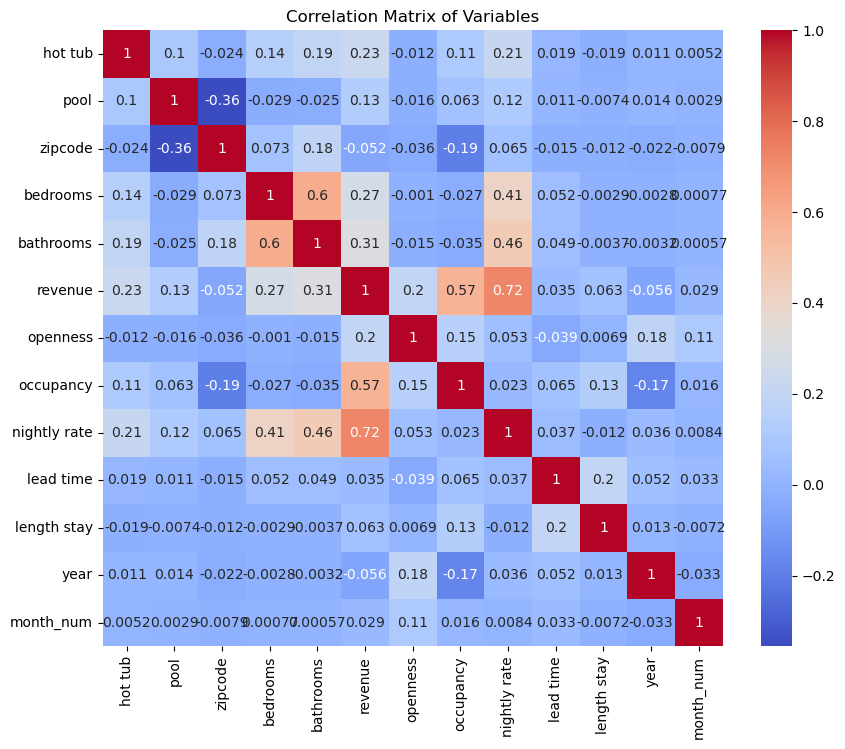

In [19]:
correlation_matrix = market_amenitiesData.corr(method='pearson')  
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix of Variables')
plt.show()

In [20]:
unique_market_amenitiesData = market_amenitiesData.drop_duplicates(subset='unified_id')


unique_market_amenitiesData['revenue_size'] = unique_market_amenitiesData['revenue'].fillna(default_revenue_size)
unique_market_amenitiesData['Amenities'] = unique_market_amenitiesData['pool'] + unique_market_amenitiesData['hot tub']
unique_market_amenitiesData['Amenities'] = unique_market_amenitiesData['Amenities'].map({0: 'Neither', 1: 'One', 2: 'Both'})

unique_market_amenitiesData = unique_market_amenitiesData.dropna(subset=['revenue'])
unique_market_amenitiesData = unique_market_amenitiesData[unique_market_amenitiesData['revenue'] <= 80000]

# Ensure 'revenue' is a float (it also implicitly removes NaN values)
unique_market_amenitiesData['revenue'] = unique_market_amenitiesData['revenue'].astype(float)

# Continuing with the plot:
fig = px.scatter(unique_market_amenitiesData, 
                 x='occupancy', 
                 y='revenue', 
                 color='Amenities',
                 size='revenue', 
                 hover_data=['host_type', 'city', 'zipcode'],
                 title='Impact of Amenities on Revenue (Unique IDs, Revenue ≤ 80K)',
                 labels={'occupancy': 'Occupancy Rate', 'revenue': 'Revenue'})

# Adjust y-axis to max at 80k for clarity
fig.update_yaxes(range=[0, 80000])

fig.update_layout(xaxis_title='Occupancy Rate',
                  yaxis_title='Revenue',
                  legend_title_text='Amenities Presence')
fig.show()


NameError: name 'default_revenue_size' is not defined

In [21]:
geoLocationData['unified_id']=geoLocationData['unified_id'].astype('str')
amenities_data['unified_id']=amenities_data['unified_id'].astype('str')
geo_amenitiesData = pd.merge(amenities_data, geoLocationData, on='unified_id', how='outer')

geo_amenitiesData.head()

,unified_id,month_x,hot tub,pool,month_y,street_name,latitude,longitude,latitude_bin,longitude_bin
0,AIR10052559,2022-12-01,1,0,2022-12,Heavenly Valley Road,34.23948,-116.87991,Medium-High,West
1,AIR10052559,2022-12-01,1,0,2022-11,Heavenly Valley Road,34.23948,-116.87991,Medium-High,West
2,AIR10052559,2022-12-01,1,0,2022-10,Heavenly Valley Road,34.23948,-116.87991,Medium-High,West
3,AIR10052559,2022-12-01,1,0,2022-09,Heavenly Valley Road,34.23948,-116.87991,Medium-High,West
4,AIR10052559,2022-12-01,1,0,2022-07,Heavenly Valley Road,34.23948,-116.87991,Medium-High,West


In [22]:
unique_geo_amenitiesData = geo_amenitiesData.drop_duplicates(subset='unified_id')

#Again using only the california region here
geo_amenitiesData_limited = unique_geo_amenitiesData[(unique_geo_amenitiesData['latitude'] >= min_lat) &
                                  (unique_geo_amenitiesData['latitude'] <= max_lat) &
                                  (unique_geo_amenitiesData['longitude'] >= min_lon) &
                                  (unique_geo_amenitiesData['longitude'] >= min_lon) &
                                  (unique_geo_amenitiesData['longitude'] <= max_lon)]



# Clean the subset by removing rows with missing latitude or longitude
geo_amenitiesData_california = geo_amenitiesData_limited.dropna(subset=['latitude', 'longitude'])
geo_amenitiesData_california.head()
# getting the amenities data here
geo_amenitiesData_california['Amenities'] = (
    geo_amenitiesData_california['hot tub'].map({0: '', 1: 'Hot Tub'}) +
    geo_amenitiesData_california['pool'].map({0: '', 1: ' Pool'}).str.strip()
).replace('', 'None')

#Using Mapbox and plotly for the visualisation
fig = px.scatter_mapbox(geo_amenitiesData_california,
                        lat="latitude",
                        lon="longitude",
                        color='Amenities', 
                        zoom=5,  
                        center={"lat": 36.7783, "lon": -119.4179},  
                        height=600,
                        width=800,
                        title="Geolocation Points in California by Amenities Presence")

fig.update_layout(mapbox_style="open-street-map")  
fig.show()

In [23]:
geoAmenities_selected = unique_geo_amenitiesData[['unified_id', 'hot tub', 'pool', 'latitude', 'longitude']]
market_selected = market_dataFinal[['unified_id', 'revenue','host_type','city']]

final_merged_df = pd.merge(geoAmenities_selected, market_selected, on='unified_id', how='outer')

final_merged_df.head()

,unified_id,hot tub,pool,latitude,longitude,revenue,host_type,city
0,AIR10052559,1.0,0.0,34.23948,-116.87991,10055.0,Professionals,Big Bear Lake
1,AIR10052559,1.0,0.0,34.23948,-116.87991,20959.0,Professionals,Big Bear Lake
2,AIR10052559,1.0,0.0,34.23948,-116.87991,13622.0,Professionals,Big Bear Lake
3,AIR10052559,1.0,0.0,34.23948,-116.87991,16185.0,Professionals,Big Bear Lake
4,AIR10052559,1.0,0.0,34.23948,-116.87991,6000.0,Professionals,Big Bear Lake


In [24]:
final_merged_df['latitude'] = pd.to_numeric(final_merged_df['latitude'], errors='coerce')
final_merged_df['longitude'] = pd.to_numeric(final_merged_df['longitude'], errors='coerce')
final_merged_df['revenue'] = pd.to_numeric(final_merged_df['revenue'], errors='coerce')

clean_df = final_merged_df.dropna(subset=['latitude', 'longitude', 'revenue'])

# Simplify amenities into a single column for visualization purposes
clean_df['Amenities'] = clean_df.apply(lambda x: 'Hot Tub & Pool' if x['hot tub'] == 1 and x['pool'] == 1
                                       else 'Hot Tub' if x['hot tub'] == 1
                                       else 'Pool' if x['pool'] == 1
                                       else 'None', axis=1)

#Here making the host type and amenities for having it as the legend
clean_df['Host and Amenities'] = clean_df['host_type'] + ' - ' + clean_df['Amenities']

# Normalize revenue for the size in the plot
clean_df['normalized_revenue'] = clean_df['revenue'] / clean_df['revenue'].max() * 30

# Generate the map visualization with the combined category for color distinction
fig = px.scatter_mapbox(clean_df,
                        lat="latitude",
                        lon="longitude",
                        color="Host and Amenities",  
                        size="normalized_revenue",  
                        hover_name="unified_id",
                        hover_data=["host_type", "city", "revenue", "Amenities"],
                        size_max=15,
                        zoom=5,
                        mapbox_style="open-street-map",
                        title="Property Distribution: Revenue, Host Type, and Amenities")

# Legend placing on the map
fig.update_layout(
    legend_title_text='Host Type and Amenities',
    legend=dict(
        title_font=dict(size=14), 
        yanchor="middle",
        y=0.5,
        xanchor="left",
        x=1.05,  
        itemsizing='constant'
    ),
    mapbox=dict(
        bearing=0,
        center=dict(lat=clean_df['latitude'].mean(), lon=clean_df['longitude'].mean()),
        pitch=0,
        zoom=5
    ),
    margin=dict(l=0, r=0, t=40, b=0)  
)

fig.show()

C:\Users\Admin\AppData\Local\Temp\ipykernel_16364\3734679830.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Admin\AppData\Local\Temp\ipykernel_16364\3734679830.py:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Admin\AppData\Local\Temp\ipykernel_16364\3734679830.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pan